# Understanding the Theory and Intuition behind Capital Asset Pricing Model (CAPM)

## CAPM

- Capital Assets Pricing Model (CAPM) is one of the most important models in Finance.
- CAPM is a model that describes the relationship between the expected return and risk of securities.
- CAPM indicates that the expected return on a security is equal to the risk-free return plus a risk premium.

## Risk Free Asset

- CAPM assumes that there exist a risk free asset with zero standard deviation.
- Investors who are extremely risk averse would prefer to buy the risk free asset to protect their money and earn a low return.
- If investors are interested in gaining more return, they have to bear more risk compared to the risk free asset.
- A risk free asset could be a U. S. government 10 year Treasury bill. This is technically a risk free asset since it's backed by the US Government.

## Market Portfolio

- Market portfolio includes all securities in the market. A good representation of the market portfolio is the S&P500 (Standard & Poor's 500 Index).
- The S&P500 is a market-capitalization-weighted index of the 500 largest U. S. publicly traded companies.
- The index is viewed as a guage of large-cap U. S. equities.

## Beta

- Beta represents the slope of the regression line (market return vs. stock return)
- Beta is a measure of the volatility or systematic risk of a security or portfolio compared to the entire market (S&P500)
- Beta is used in the CAPM and describes the relationship between systematic risk and expected return for assets.
+ Tech stocks generally have higher betas than S&P500 but they also have excess returns
    - Beta = 1, this indicates that its price activity is strongly correlated with the market.
    - Beta < 1 (defensive): indicates that the security is theoretically less volatile than the market. (Ex: Utility and consumer goods (P&G). If the stock is included, this will make the portfolio less risky compared to the same portfolio without the stock.
    - Beta > 1 (aggressive), indicates that the security's price is more volatile than the market. For instance, Tesla stock beta is 1.26 indicating that it's 26% more volatile than the market. It will do better if the economy is booming and worse in cases of recession.

# Import Libraries/Datasets and Visualized Stocks Data

In [1]:
import pandas as pd
import seaborn as sns
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
import plotly.graph_objects as go

In [2]:
# Read the stock data file
stocks_df = pd.read_csv("D:\Python and Machine Learning for Financial Analysis\stock.csv")
stocks_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [3]:
# Sorted the data based on Date
stocks_df = stocks_df.sort_values(by = ['Date'])
stocks_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [4]:
# Function to normalize the prices based on the initial price
def normalize(df):
  x = df.copy()
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

In [5]:
# Function to plot interactive plot
def interactive_plot(df, title):
  fig = px.line(title = title)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i)
  fig.show()

In [6]:
# Plotted interactive chart
interactive_plot(stocks_df, 'Prices')

In [7]:
# Plotted normalized interactive chart
interactive_plot(normalize(stocks_df), 'Normalized Prices')

# Calculated Daily Returns

In [8]:
# Function to calculate the daily returns 
def daily_return(df):

  df_daily_return = df.copy()
  
  # Looped through each stock
  for i in df.columns[1:]:
    
    # Looped through each row belonging to the stock
    for j in range(1, len(df)):
      
      # Calculated the percentage of change from the previous day
      df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1]) * 100
    
    # set the value of first row to zero, as previous value is not available
    df_daily_return[i][0] = 0
  return df_daily_return

In [9]:
# Got the daily returns 
stocks_daily_return = daily_return(stocks_df)
stocks_daily_return

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2012-01-13,-0.374946,-1.205144,-0.166006,1.813685,1.415339,-0.769869,-19.327430,-0.738516,-0.494792
2,2012-01-17,1.164812,0.857909,0.598603,-0.809717,1.815943,0.468852,16.717854,0.574410,0.355295
3,2012-01-18,1.038382,-0.239234,0.264463,3.918367,4.282725,0.594448,0.789470,0.688856,1.110793
4,2012-01-19,-0.316937,0.666134,0.296736,0.549882,2.644634,-0.303752,-0.186494,1.052283,0.493866
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,0.362467,5.579446,-0.533156,0.000000,2.109065,-0.309917,-0.133153,0.589774,0.642974
2155,2020-08-06,3.488923,-1.193483,-0.033501,10.406699,0.623082,0.534082,0.307062,1.797626,0.642770
2156,2020-08-07,-2.449458,-1.265966,0.603217,3.087768,-1.784187,-0.919762,-2.475194,-0.373974,0.063303
2157,2020-08-10,1.453480,5.522880,0.599604,13.767729,-0.609323,1.720552,-2.350092,0.107728,0.274222


# Higher Average Daily Return by Amazon and Google when compared to S&P500

In [10]:
stocks_daily_return.mean()
# S&P500 average daily return is 0.049%
# Amazon average daily return is 0.15%
# Google average daily return is 0.084%

AAPL     0.107695
BA       0.065907
T        0.008159
MGM      0.064662
AMZN     0.151122
IBM     -0.006091
TSLA     0.238398
GOOG     0.084392
sp500    0.049316
dtype: float64

# Calculated Beta for a Single Stock

In [11]:
# Selected any stock, let's say Apple 
stocks_daily_return['AAPL']

0       0.000000
1      -0.374946
2       1.164812
3       1.038382
4      -0.316937
          ...   
2154    0.362467
2155    3.488923
2156   -2.449458
2157    1.453480
2158   -2.973987
Name: AAPL, Length: 2159, dtype: float64

In [12]:
# Selected the S&P500 (Market)
stocks_daily_return['sp500']

0       0.000000
1      -0.494792
2       0.355295
3       1.110793
4       0.493866
          ...   
2154    0.642974
2155    0.642770
2156    0.063303
2157    0.274222
2158   -0.796913
Name: sp500, Length: 2159, dtype: float64

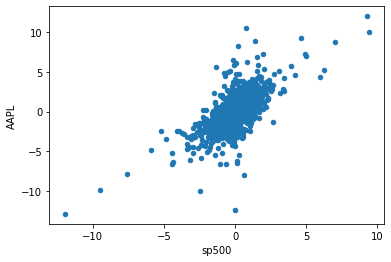

In [13]:
# plotted a scatter plot between the selected stock and the S&P500 (Market)
stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = 'AAPL')

In [14]:
# Fitted a polynomial between the selected stock and the S&P500 (Poly with order = 1 is a straight line)

# beta represents the slope of the line regression line (market return vs. stock return). 
# Beta is a measure of the volatility or systematic risk of a security or portfolio compared to the entire market (S&P500) 
# Beta is used in the CAPM and describes the relationship between systematic risk and expected return for assets 

# Beta = 1.0, this indicates that its price activity is strongly correlated with the market. 
# Beta < 1, indicates that the security is theoretically less volatile than the market (Ex: Utility stocks). If the stock is included, this will make the portfolio less risky compared to the same portfolio without the stock.
# Beta > 1, indicates that the security's price is more volatile than the market. For instance, Tesla stock beta is 1.26 indicating that it's 26% more volatile than the market. 
# Tech stocks generally have higher betas than S&P500 but they also have excess returns
# MGM is 65% more volatile than the S&P500!


beta, alpha = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return['AAPL'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('AAPL', beta, alpha))  

Beta for AAPL stock is = 1.1128924148678108 and alpha is = 0.052812084694402746


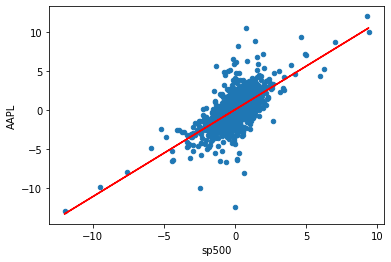

In [15]:
# Now let's plot the scatter plot and the straight line on one plot
stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = 'AAPL')

# Straight line equation with alpha and beta parameters 
# Straight line equation is y = beta * rm + alpha
plt.plot(stocks_daily_return['sp500'], beta * stocks_daily_return['sp500'] + alpha, '-', color = 'r')


# Calculated Beta for Tesla Inc. and Compared it with Apple

Beta for TSLA stock is = 1.2686150101095914 and alpha is = 0.17583492165165834


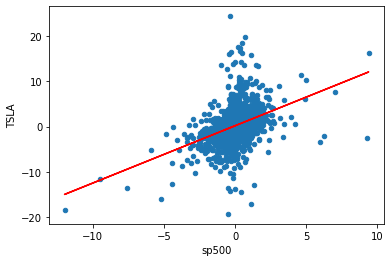

In [16]:
# Fitted a polynomial between the selected stock and the S&P500 (Poly with order = 1 is a straight line)
beta, alpha = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return['TSLA'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('TSLA', beta, alpha))
# Now let's plot the scatter plot and the straight line on one plot
stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = 'TSLA')

# Straight line equation with alpha and beta parameters 
# Straight line equation is y = beta * rm + alpha
plt.plot(stocks_daily_return['sp500'], beta * stocks_daily_return['sp500'] + alpha, '-', color = 'r')

# Apply the CAPM formula to an Individual Stock

In [17]:
beta

1.2686150101095914

In [18]:
# Let's calculate the average daily rate of return for S&P500
stocks_daily_return['sp500'].mean()

0.049316006600389206

In [19]:
# Let's calculate the annualized rate of return for S&P500 
# Noted that out of 365 days/year, stock exchanges are closed for 104 days during weekend days (Saturday and Sunday) 
# Checked my answers with: https://dqydj.com/sp-500-return-calculator/
rm = stocks_daily_return['sp500'].mean() * 252
rm

12.42763366329808

In [20]:
# Assumed risk free rate is zero
# Also you can use the yield of a 10-years U.S. Government bond as a risk free rate
rf = 0 

# Calculated return for any security (TSLA) using CAPM  
ER_TSLA = rf + (beta * (rm-rf)) 

In [21]:
ER_TSLA

15.765882605403192

# Applied CAPM formula to calculate the Return for AT&T

In [22]:
# Calculated Beta for AT&T first
beta, alpha = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return['T'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('T', beta, alpha)) 

Beta for T stock is = 0.744629345474785 and alpha is = -0.028563430198461717


In [23]:
# Calculated return for AT&T using CAPM  
ER_T = rf + (beta * (rm - rf)) 
print(ER_T)

9.253980720502053


# Calculated Beta for All Stocks

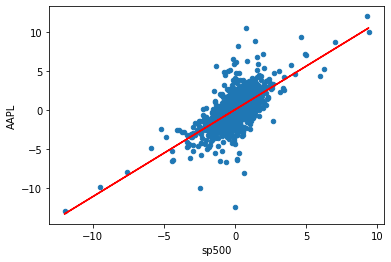

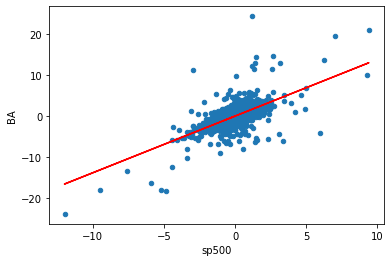

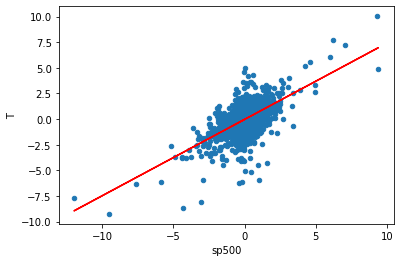

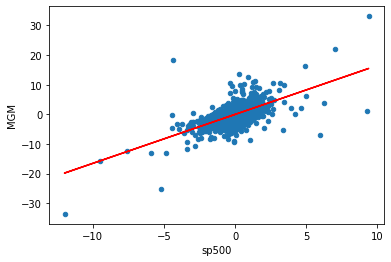

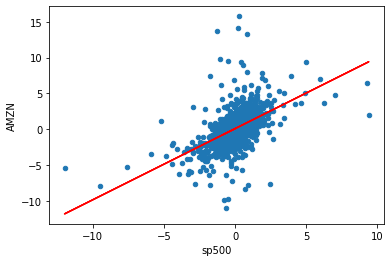

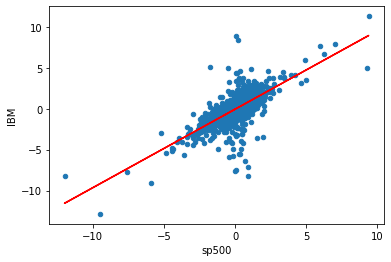

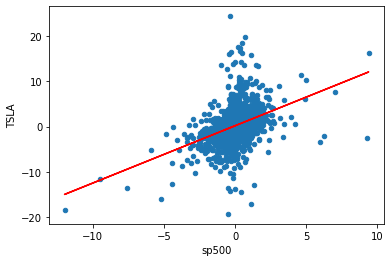

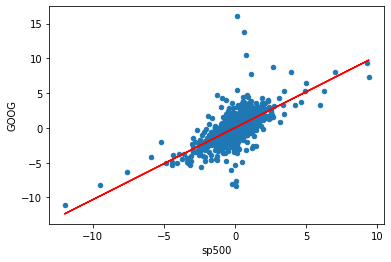

In [24]:
# Let's create a placeholder for all betas and alphas (empty dictionaries)
beta = {}
alpha = {}

# Looped on every stock daily return
for i in stocks_daily_return.columns:

  # Ignored the date and S&P500 Columns 
  if i != 'Date' and i != 'sp500':
    # plotted a scatter plot between each individual stock and the S&P500 (Market)
    stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = i)
    
    # Fit a polynomial between each stock and the S&P500 (Poly with order = 1 is a straight line)
    b, a = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return[i], 1)
    
    plt.plot(stocks_daily_return['sp500'], b * stocks_daily_return['sp500'] + a, '-', color = 'r')
    
    beta[i] = b
    
    alpha[i] = a
    
    plt.show()

In [25]:
# Let's view Beta for every stock 
beta

{'AAPL': 1.1128924148678108,
 'BA': 1.3828672010892789,
 'T': 0.744629345474785,
 'MGM': 1.6535677065180125,
 'AMZN': 0.9917345712576852,
 'IBM': 0.9604149148095252,
 'TSLA': 1.2686150101095914,
 'GOOG': 1.0348817687428564}

In [26]:
# Let's view alpha for each of the stocks
# Alpha describes the strategy's ability to beat the market (S&P500)
# Alpha indicates the “excess return” or “abnormal rate of return,” 
# A positive 0.175 alpha for Tesla means that the portfolio’s return exceeded the benchmark S&P500 index by 17%.

alpha

{'AAPL': 0.052812084694402746,
 'BA': -0.002290698329753476,
 'T': -0.028563430198461717,
 'MGM': -0.016885305520478802,
 'AMZN': 0.10221396417765226,
 'IBM': -0.05345494150445125,
 'TSLA': 0.17583492165165834,
 'GOOG': 0.03335558721467018}

# Interactive Plot showing S&P500 Daily Returns Vs. Every Stock

In [27]:
# Let's do the same plots but in an interactive way
# Explored some wierd points in the dataset: Tesla stock return was at 24% when the S&P500 return was -0.3%!

for i in stocks_daily_return.columns:
  
  if i != 'Date' and i != 'sp500':
    
    # Used plotly express to plot the scatter plot for every stock vs. the S&P500
    fig = px.scatter(stocks_daily_return, x = 'sp500', y = i, title = i)

    # Fit a straight line to the data and obtain beta and alpha
    b, a = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return[i], 1)
    
    # Plotted the straight line 
    fig.add_scatter(x = stocks_daily_return['sp500'], y = b*stocks_daily_return['sp500'] + a)
    fig.show()

# Applied CAPM formula to Calculate the Return for the Portfolio

In [28]:
# Obtained a list of all stock names
keys = list(beta.keys())
keys

['AAPL', 'BA', 'T', 'MGM', 'AMZN', 'IBM', 'TSLA', 'GOOG']

In [29]:
# Defined the expected return dictionary
ER = {}

rf = 0 # assumed risk free rate is zero in this case
rm = stocks_daily_return['sp500'].mean() * 252 # this is the expected return of the market 
rm

12.42763366329808

In [30]:
for i in keys:
  # Calculated return for every security using CAPM  
  ER[i] = rf + (beta[i] * (rm-rf)) 

In [31]:
for i in keys:
  print('Expected Return Based on CAPM for {} is {}%'.format(i, ER[i]))

Expected Return Based on CAPM for AAPL is 13.830619238640297%
Expected Return Based on CAPM for BA is 17.185766980127916%
Expected Return Based on CAPM for T is 9.253980720502053%
Expected Return Based on CAPM for MGM is 20.549933694065853%
Expected Return Based on CAPM for AMZN is 12.324913942818496%
Expected Return Based on CAPM for IBM is 11.935684726020414%
Expected Return Based on CAPM for TSLA is 15.765882605403192%
Expected Return Based on CAPM for GOOG is 12.861131506762181%


In [32]:
# Assumed equal weights in the portfolio
portfolio_weights = 1/8 * np.ones(8) 
portfolio_weights

array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125])

In [33]:
# Calculated the portfolio return 
ER_portfolio = sum(list(ER.values()) * portfolio_weights)
ER_portfolio

14.21348917679255

In [34]:
print('Expected Return Based on CAPM for the portfolio is {}%\n'.format(ER_portfolio))

Expected Return Based on CAPM for the portfolio is 14.21348917679255%



# Calculated the Expected Return for the Portfolio assuming we only have 50% allocation in Apple and 50% in Amazon

In [35]:
ER['AMZN']

12.324913942818496

In [36]:
# Calculate the portfolio return 
ER_portfolio_2 = 0.5 * ER['AAPL'] +  0.5 * ER['AMZN']
ER_portfolio_2

13.077766590729397